In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## U-NET

In [ ]:
import torch
import torch.nn as nn

class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)

        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)

        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)

        return x, p

class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c+out_c, out_c)

    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.conv(x)
        return x

class build_unet(nn.Module):
    def __init__(self):
        super().__init__()

        """ Encoder """
        self.e1 = encoder_block(3, 64)
        self.e2 = encoder_block(64, 128)
        self.e3 = encoder_block(128, 256)
        self.e4 = encoder_block(256, 512)

        """ Bottleneck """
        self.b = conv_block(512, 1024)

        """ Decoder """
        self.d1 = decoder_block(1024, 512)
        self.d2 = decoder_block(512, 256)
        self.d3 = decoder_block(256, 128)
        self.d4 = decoder_block(128, 64)

        """ Classifier """
        self.outputs = nn.Conv2d(64, 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        outputs = self.outputs(d4)

        return outputs

if __name__ == "__main__":
    x = torch.randn((2, 3, 512, 512))
    f = build_unet()
    y = f(x)
    print(y.shape)


## TEST

In [ ]:
import os
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset
from glob import glob # Added glob import
from torch.utils.data import DataLoader # Added DataLoader import
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score
from tqdm import tqdm
import imageio

## Testing

In [ ]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

def preprocess_image(image_path, img_size=(512, 512)):
    """
    Preprocesses the input image for the model.

    Args:
        image_path (str): Path to the image file.
        img_size (tuple): Desired size for resizing the image (H, W).

    Returns:
        torch.Tensor: Preprocessed image tensor.
        np.ndarray: Original image for visualization.
    """
    # Read and resize the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization
    image = cv2.resize(image, img_size)

    # Normalize and convert to tensor
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to [C, H, W] and normalize to [0, 1]
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

def visualize_results(original_image, predicted_mask):
    """
    Visualizes the original image and predicted mask side by side.

    Args:
        original_image (np.ndarray): Original input image.
        predicted_mask (np.ndarray): Predicted binary mask.
    """
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(predicted_mask.squeeze(), cmap="gray")  # Squeeze the extra channel
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"  # Update with your model path
    image_path = "/content/drive/MyDrive/boundary_drive_file/split_data/test/images/p15_aug_40.png"    # Update with the input image path

    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    model = build_unet()  # Replace with your model's architecture definition
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0).cpu().numpy()  # Squeeze batch dimension

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8) * 255  # Convert to binary and scale to 0–255

    # Visualize results
    visualize_results(original_image, binary_mask)


## Test save

<ipython-input-47-c91150023ea5>:72: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


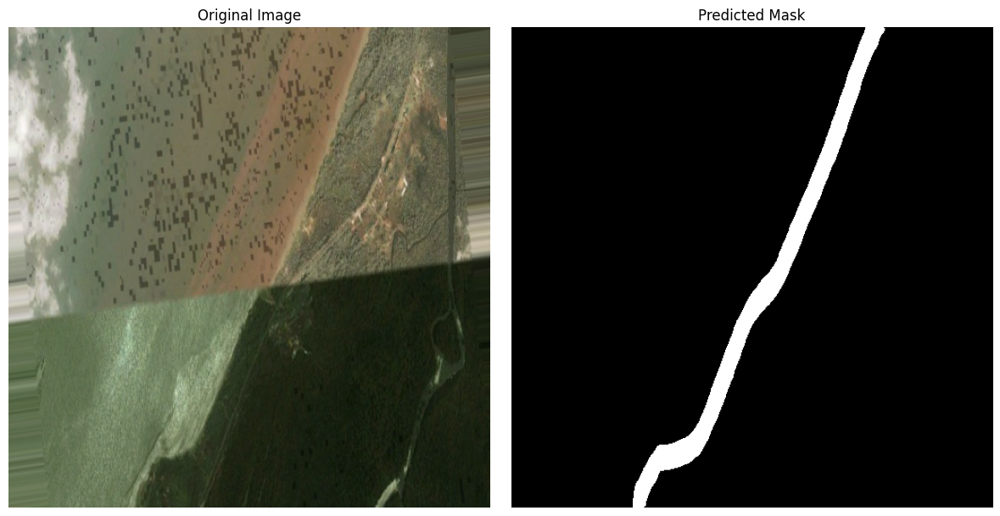

Predicted mask saved to /content/drive/MyDrive/boundary_drive_file/0_predicted_mask.png


In [ ]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

def preprocess_image(image_path, img_size=(512, 512)):
    """
    Preprocesses the input image for the model.

    Args:
        image_path (str): Path to the image file.
        img_size (tuple): Desired size for resizing the image (H, W).

    Returns:
        torch.Tensor: Preprocessed image tensor.
        np.ndarray: Original image for visualization.
    """
    # Read and resize the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization
    image = cv2.resize(image, img_size)

    # Normalize and convert to tensor
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to [C, H, W] and normalize to [0, 1]
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

def visualize_results(original_image, predicted_mask):
    """
    Visualizes the original image and predicted mask side by side.

    Args:
        original_image (np.ndarray): Original input image.
        predicted_mask (np.ndarray): Predicted binary mask.
    """
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(predicted_mask.squeeze(), cmap="gray")  # Squeeze the extra channel
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    Paths for drive
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"  # Update with your model path
    image_path = "/content/drive/MyDrive/boundary_drive_file/split_data/train/images/p7_aug_71.png"  # Update with the input image path
    output_mask_path = "/content/drive/MyDrive/boundary_drive_file/0_predicted_mask.png"  # Path to save the predicted mask

    # # Paths
    # model_path = "final_model.pth"  # Update with your model path
    # image_path = "split_data/train/images/p7_aug_71.png"  # Update with the input image path
    # output_mask_path = "Trials/predicted_mask.png"  # Path to save the predicted mask

    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    model = build_unet()  # Replace with your model's architecture definition
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0).cpu().numpy()  # Squeeze batch dimension

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8) * 255  # Convert to binary and scale to 0–255

    # Squeeze the unnecessary dimension from binary_mask
    binary_mask = binary_mask.squeeze() # Removes the dimension with size 1

    # Visualize results
    visualize_results(original_image, binary_mask)

    # Save the predicted binary mask as a single-channel image
    cv2.imwrite(output_mask_path, binary_mask)  # Save the predicted mask as an image

    print(f"Predicted mask saved to {output_mask_path}")


## Test save digitized (mask to line)

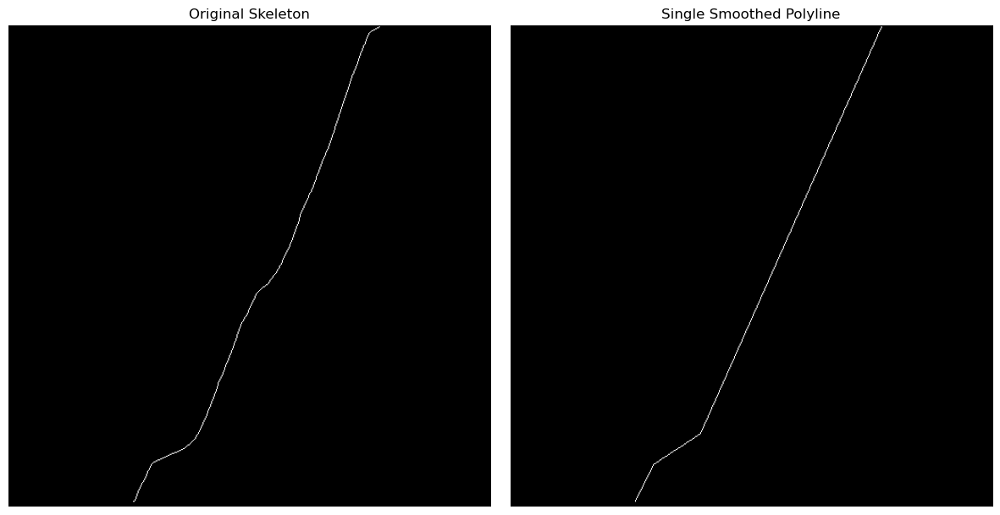

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import skeletonize

# Load the binary mask image
# mask_path = "/content/drive/MyDrive/boundary_drive_file/predicted_mask.png"
# mask_path = "/content/drive/MyDrive/boundary_drive_file/predicted_mask.png"
mask_path = "Trials/predicted_mask.png"
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

# Ensure the image is binary (convert to 0 and 255)
_, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

# Convert to binary (0 and 1) for skeletonization
binary_mask[binary_mask == 255] = 1

# Perform skeletonization
skeleton = skeletonize(binary_mask)

# Convert skeleton back to 0-255 for visualization
skeleton_image = (skeleton * 255).astype(np.uint8)

# Find contours in the skeleton image
contours, _ = cv2.findContours(skeleton_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Keep only the longest contour to remove double lines
longest_contour = max(contours, key=lambda x: cv2.arcLength(x, True))  # Find longest contour  # Find longest contour

# Smooth the longest contour
epsilon = 0.01 * cv2.arcLength(longest_contour, True)  # Adjust for smoothness
smoothed_contour = cv2.approxPolyDP(longest_contour, epsilon, True)

# Create a blank image to draw the final smooth polyline
smooth_polyline = np.zeros_like(skeleton_image)
cv2.drawContours(smooth_polyline, [smoothed_contour], -1, 255, thickness=1)

# Display the original skeleton and the smoothed single polyline
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(skeleton_image, cmap='gray')
plt.title("Original Skeleton")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(smooth_polyline, cmap='gray')
plt.title("Single Smoothed Polyline")
plt.axis("off")

plt.tight_layout()
plt.show()

# Save the final smooth polyline
# cv2.imwrite("/mnt/data/single_smooth_polyline.png", smooth_polyline)
# print("Single smooth polyline saved.")


## Overlay mask on image

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_3108\3325807819.py:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location

Shape of predicted mask: torch.Size([1, 512, 512])


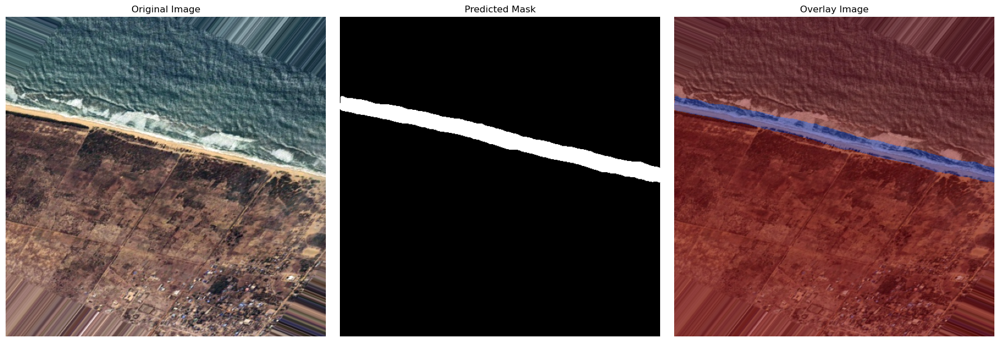

In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    # Read and resize the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    image = cv2.resize(image, img_size)

    # Normalize and convert to tensor
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to [C, H, W] and normalize to [0, 1]
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to overlay the predicted mask on the image
def overlay_mask(original_image, predicted_mask, alpha=0.5):
    # Ensure the predicted mask is 2D
    if predicted_mask.ndim > 2:
        predicted_mask = np.squeeze(predicted_mask)  # Squeeze extra dimensions if present

    if predicted_mask.ndim != 2:
        raise ValueError("Predicted mask must be a single-channel grayscale image.")

    # Convert the mask to uint8 (0–255)
    predicted_mask = (predicted_mask * 255).astype(np.uint8)

    # Apply color map to the mask
    predicted_mask_colored = cv2.applyColorMap(predicted_mask, cv2.COLORMAP_JET)

    # Overlay the mask on the original image
    overlay = cv2.addWeighted(original_image, 1 - alpha, predicted_mask_colored, alpha, 0)
    return overlay

# Function to visualize the results
def visualize_results(original_image, predicted_mask, overlay_image):
    plt.figure(figsize=(18, 6))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    # Predicted mask
    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(predicted_mask), cmap="gray")  # Ensure correct shape for Matplotlib
    plt.title("Predicted Mask")
    plt.axis("off")

    # Overlay image
    plt.subplot(1, 3, 3)
    plt.imshow(overlay_image)
    plt.title("Overlay Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "final_model.pth"  # Update with your model path
    # image_path = "Cshore2021.PNG"  # Update with the input image path
    image_path = "split_data/test/images/p5_aug_66.png"
    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    # def build_unet():  # Replace with your U-Net definition
    #     raise NotImplementedError("Define your model architecture here.")
    model = build_unet()
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0)  # Squeeze batch dimension
        print("Shape of predicted mask:", pred_mask.shape)  # Debugging shape of the mask

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]  # Use first channel for binary segmentation if needed

        pred_mask = pred_mask.cpu().numpy()  # Move to CPU and convert to numpy array

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)  # Convert to binary (0, 1)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Overlay the mask on the original image
    overlay_image = overlay_mask(original_image, binary_mask_resized)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, overlay_image)


## Overlay line on image

<ipython-input-66-b81fcd66e33c>:103: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


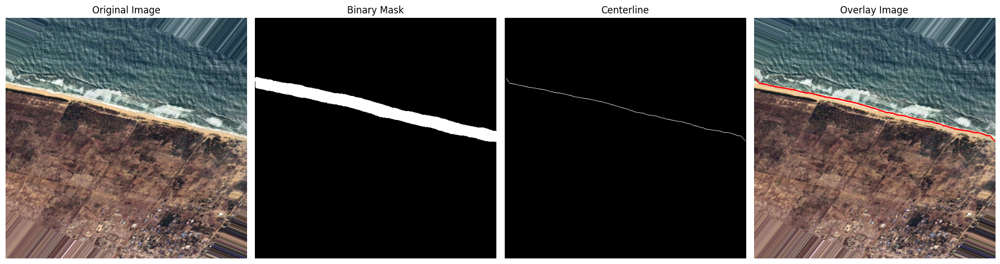

In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from skimage.morphology import skeletonize

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    # Read and resize the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    image = cv2.resize(image, img_size)

    # Normalize and convert to tensor
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to [C, H, W] and normalize to [0, 1]
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to extract the centerline of a binary mask
def extract_centerline(binary_mask):
    # Ensure the binary mask is boolean
    binary_mask = binary_mask.astype(bool)

    # Perform skeletonization to extract the centerline
    skeleton = skeletonize(binary_mask)

    # Convert back to uint8 for visualization (0-255)
    centerline = (skeleton * 255).astype(np.uint8)
    return centerline

# Function to overlay the centerline on the original image
def overlay_centerline(original_image, centerline, line_color=(255, 0, 0)):
    # Ensure the centerline is 2D
    if centerline.ndim > 2:
        centerline = np.squeeze(centerline)

    if centerline.ndim != 2:
        raise ValueError("Centerline must be a single-channel grayscale image.")

    # Convert the original image to BGR for overlay
    overlay_image = original_image.copy()

    # Find the coordinates of the centerline pixels
    coords = np.column_stack(np.where(centerline > 0))

    # Overlay the centerline pixels on the original image
    for y, x in coords:
        cv2.circle(overlay_image, (x, y), radius=1, color=line_color, thickness=-1)

    return overlay_image

# Function to visualize the results
def visualize_results(original_image, binary_mask, centerline, overlay_image):
    plt.figure(figsize=(18, 6))

    # Original image
    plt.subplot(1, 4, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    # Binary mask
    plt.subplot(1, 4, 2)
    plt.imshow(binary_mask, cmap="gray")
    plt.title("Binary Mask")
    plt.axis("off")

    # Centerline
    plt.subplot(1, 4, 3)
    plt.imshow(centerline, cmap="gray")
    plt.title("Centerline")
    plt.axis("off")

    # Overlay image
    plt.subplot(1, 4, 4)
    plt.imshow(overlay_image)
    plt.title("Overlay Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # # Paths
    # model_path = "final_model.pth"  # Update with your model path
    # image_path = "split_data/test/images/p5_aug_66.png"  # Update with the input image path

     # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"  # Update with your model path
    image_path = "/content/drive/MyDrive/boundary_drive_file/split_data/test/images/p5_aug_66.png"  # Update with the input image path

    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    model = build_unet()  # Replace with your U-Net definition
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0)  # Squeeze batch dimension

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]  # Use first channel for binary segmentation if needed

        pred_mask = pred_mask.cpu().numpy()  # Move to CPU and convert to numpy array

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)  # Convert to binary (0, 1)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Extract the centerline from the binary mask
    centerline = extract_centerline(binary_mask_resized)

    # Overlay the centerline on the original image
    overlay_image = overlay_centerline(original_image, centerline)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, centerline, overlay_image)

## Overlay mask on image 2

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_3108\796452901.py:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=

Shape of predicted mask: torch.Size([1, 512, 512])


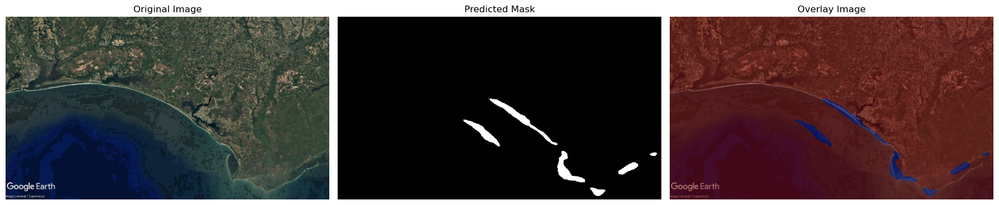

In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    # Read and resize the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    image = cv2.resize(image, img_size)

    # Normalize and convert to tensor
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to [C, H, W] and normalize to [0, 1]
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to overlay the predicted mask on the image
def overlay_mask(original_image, predicted_mask, alpha=0.5):
    # Ensure the predicted mask is 2D
    if predicted_mask.ndim > 2:
        predicted_mask = np.squeeze(predicted_mask)  # Squeeze extra dimensions if present

    if predicted_mask.ndim != 2:
        raise ValueError("Predicted mask must be a single-channel grayscale image.")

    # Convert the mask to uint8 (0–255)
    predicted_mask = (predicted_mask * 255).astype(np.uint8)

    # Apply color map to the mask
    predicted_mask_colored = cv2.applyColorMap(predicted_mask, cv2.COLORMAP_JET)

    # Overlay the mask on the original image
    overlay = cv2.addWeighted(original_image, 1 - alpha, predicted_mask_colored, alpha, 0)
    return overlay

# Function to visualize the results
def visualize_results(original_image, predicted_mask, overlay_image):
    plt.figure(figsize=(18, 6))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    # Predicted mask
    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(predicted_mask), cmap="gray")  # Ensure correct shape for Matplotlib
    plt.title("Predicted Mask")
    plt.axis("off")

    # Overlay image
    plt.subplot(1, 3, 3)
    plt.imshow(overlay_image)
    plt.title("Overlay Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "final_model.pth"  # Update with your model path
    image_path = "p19.jpg"  # Update with the input image path

    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    # def build_unet():  # Replace with your U-Net definition
    #     raise NotImplementedError("Define your model architecture here.")
    model = build_unet()
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0)  # Squeeze batch dimension
        print("Shape of predicted mask:", pred_mask.shape)  # Debugging shape of the mask

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]  # Use first channel for binary segmentation if needed

        pred_mask = pred_mask.cpu().numpy()  # Move to CPU and convert to numpy array

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)  # Convert to binary (0, 1)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Overlay the mask on the original image
    overlay_image = overlay_mask(original_image, binary_mask_resized)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, overlay_image)


## Overlay line on image 2

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_11020\1433201136.py:99: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_locatio

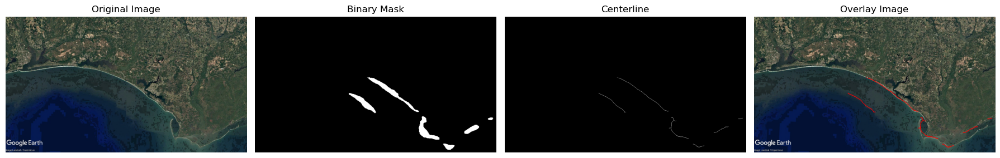

In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from skimage.morphology import skeletonize

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    # Read and resize the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    image = cv2.resize(image, img_size)

    # Normalize and convert to tensor
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to [C, H, W] and normalize to [0, 1]
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to extract the centerline of a binary mask
def extract_centerline(binary_mask):
    # Ensure the binary mask is boolean
    binary_mask = binary_mask.astype(bool)

    # Perform skeletonization to extract the centerline
    skeleton = skeletonize(binary_mask)

    # Convert back to uint8 for visualization (0-255)
    centerline = (skeleton * 255).astype(np.uint8)
    return centerline

# Function to overlay the centerline on the original image
def overlay_centerline(original_image, centerline, line_color=(255, 0, 0)):
    # Ensure the centerline is 2D
    if centerline.ndim > 2:
        centerline = np.squeeze(centerline)

    if centerline.ndim != 2:
        raise ValueError("Centerline must be a single-channel grayscale image.")

    # Convert the original image to BGR for overlay
    overlay_image = original_image.copy()

    # Find the coordinates of the centerline pixels
    coords = np.column_stack(np.where(centerline > 0))

    # Overlay the centerline pixels on the original image
    for y, x in coords:
        cv2.circle(overlay_image, (x, y), radius=1, color=line_color, thickness=-1)

    return overlay_image

# Function to visualize the results
def visualize_results(original_image, binary_mask, centerline, overlay_image):
    plt.figure(figsize=(18, 6))

    # Original image
    plt.subplot(1, 4, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    # Binary mask
    plt.subplot(1, 4, 2)
    plt.imshow(binary_mask, cmap="gray")
    plt.title("Binary Mask")
    plt.axis("off")

    # Centerline
    plt.subplot(1, 4, 3)
    plt.imshow(centerline, cmap="gray")
    plt.title("Centerline")
    plt.axis("off")

    # Overlay image
    plt.subplot(1, 4, 4)
    plt.imshow(overlay_image)
    plt.title("Overlay Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "final_model.pth"  # Update with your model path
    image_path = "p19.jpg"  # Update with the input image path

    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    model = build_unet()  # Replace with your U-Net definition
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0)  # Squeeze batch dimension

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]  # Use first channel for binary segmentation if needed

        pred_mask = pred_mask.cpu().numpy()  # Move to CPU and convert to numpy array

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)  # Convert to binary (0, 1)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Extract the centerline from the binary mask
    centerline = extract_centerline(binary_mask_resized)

    # Overlay the centerline on the original image
    overlay_image = overlay_centerline(original_image, centerline)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, centerline, overlay_image)


## Overlay mask on image 3

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_3108\553515280.py:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=

Shape of predicted mask: torch.Size([1, 512, 512])


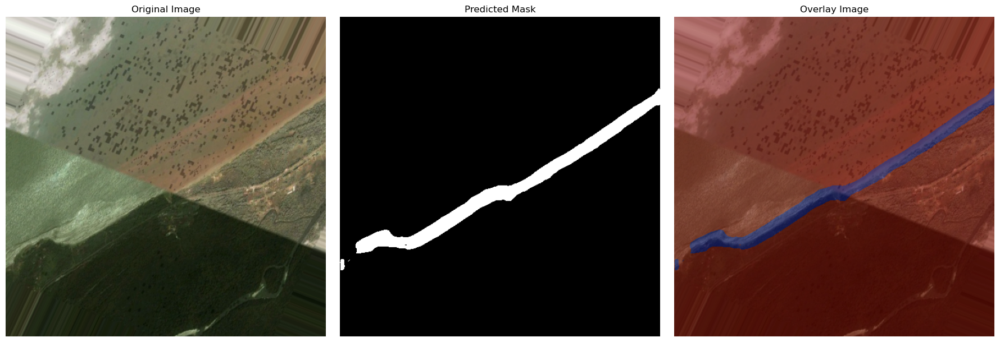

In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    # Read and resize the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    image = cv2.resize(image, img_size)

    # Normalize and convert to tensor
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to [C, H, W] and normalize to [0, 1]
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to overlay the predicted mask on the image
def overlay_mask(original_image, predicted_mask, alpha=0.5):
    # Ensure the predicted mask is 2D
    if predicted_mask.ndim > 2:
        predicted_mask = np.squeeze(predicted_mask)  # Squeeze extra dimensions if present

    if predicted_mask.ndim != 2:
        raise ValueError("Predicted mask must be a single-channel grayscale image.")

    # Convert the mask to uint8 (0–255)
    predicted_mask = (predicted_mask * 255).astype(np.uint8)

    # Apply color map to the mask
    predicted_mask_colored = cv2.applyColorMap(predicted_mask, cv2.COLORMAP_JET)

    # Overlay the mask on the original image
    overlay = cv2.addWeighted(original_image, 1 - alpha, predicted_mask_colored, alpha, 0)
    return overlay

# Function to visualize the results
def visualize_results(original_image, predicted_mask, overlay_image):
    plt.figure(figsize=(18, 6))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    # Predicted mask
    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(predicted_mask), cmap="gray")  # Ensure correct shape for Matplotlib
    plt.title("Predicted Mask")
    plt.axis("off")

    # Overlay image
    plt.subplot(1, 3, 3)
    plt.imshow(overlay_image)
    plt.title("Overlay Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "final_model.pth"  # Update with your model path
    image_path = "split_data/test/images/p7_aug_72.png"  # Update with the input image path

    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    # def build_unet():  # Replace with your U-Net definition
    #     raise NotImplementedError("Define your model architecture here.")
    model = build_unet()
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0)  # Squeeze batch dimension
        print("Shape of predicted mask:", pred_mask.shape)  # Debugging shape of the mask

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]  # Use first channel for binary segmentation if needed

        pred_mask = pred_mask.cpu().numpy()  # Move to CPU and convert to numpy array

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)  # Convert to binary (0, 1)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Overlay the mask on the original image
    overlay_image = overlay_mask(original_image, binary_mask_resized)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, overlay_image)


## Overlay line on image 3

C:\ProgramData\anaconda3.0\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,
C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_7896\989163878.py:100: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full contro

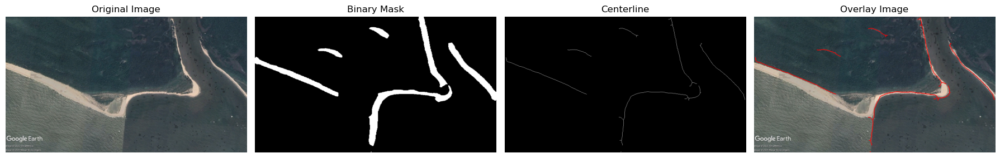

In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from skimage.morphology import skeletonize

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    # Read and resize the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    image = cv2.resize(image, img_size)

    # Normalize and convert to tensor
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to [C, H, W] and normalize to [0, 1]
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to extract the centerline of a binary mask
def extract_centerline(binary_mask):
    # Ensure the binary mask is boolean
    binary_mask = binary_mask.astype(bool)

    # Perform skeletonization to extract the centerline
    skeleton = skeletonize(binary_mask)

    # Convert back to uint8 for visualization (0-255)
    centerline = (skeleton * 255).astype(np.uint8)
    return centerline

# Function to overlay the centerline on the original image
def overlay_centerline(original_image, centerline, line_color=(255, 0, 0)):
    # Ensure the centerline is 2D
    if centerline.ndim > 2:
        centerline = np.squeeze(centerline)

    if centerline.ndim != 2:
        raise ValueError("Centerline must be a single-channel grayscale image.")

    # Convert the original image to BGR for overlay
    overlay_image = original_image.copy()

    # Find the coordinates of the centerline pixels
    coords = np.column_stack(np.where(centerline > 0))

    # Overlay the centerline pixels on the original image
    for y, x in coords:
        cv2.circle(overlay_image, (x, y), radius=1, color=line_color, thickness=-1)

    return overlay_image

# Function to visualize the results
def visualize_results(original_image, binary_mask, centerline, overlay_image):
    plt.figure(figsize=(18, 6))

    # Original image
    plt.subplot(1, 4, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    # Binary mask
    plt.subplot(1, 4, 2)
    plt.imshow(binary_mask, cmap="gray")
    plt.title("Binary Mask")
    plt.axis("off")

    # Centerline
    plt.subplot(1, 4, 3)
    plt.imshow(centerline, cmap="gray")
    plt.title("Centerline")
    plt.axis("off")

    # Overlay image
    plt.subplot(1, 4, 4)
    plt.imshow(overlay_image)
    plt.title("Overlay Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "final_model.pth"  # Update with your model path
    # image_path = "split_data/test/images/p7_aug_72.png"  # Update with the input image path
    image_path = "1.jpg"  # Update with the input image path

    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    model = build_unet()  # Replace with your U-Net definition
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0)  # Squeeze batch dimension

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]  # Use first channel for binary segmentation if needed

        pred_mask = pred_mask.cpu().numpy()  # Move to CPU and convert to numpy array

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)  # Convert to binary (0, 1)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Extract the centerline from the binary mask
    centerline = extract_centerline(binary_mask_resized)

    # Overlay the centerline on the original image
    overlay_image = overlay_centerline(original_image, centerline)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, centerline, overlay_image)


## Overlay mask on image 4

<ipython-input-72-a41243b29b08>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


Shape of predicted mask: torch.Size([1, 512, 512])


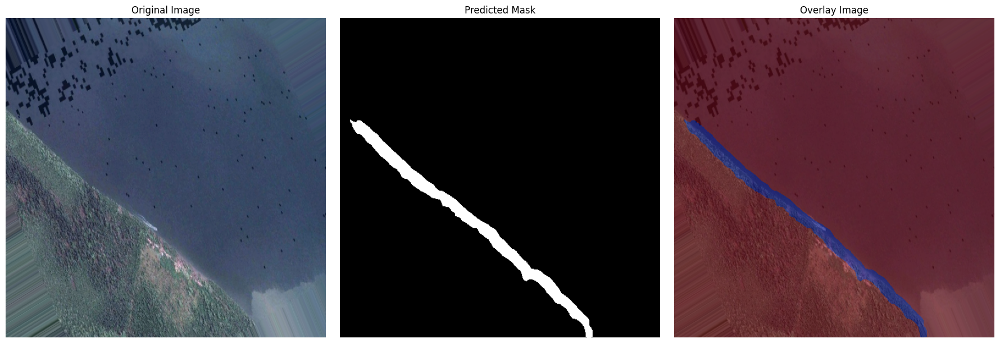

In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    # Read and resize the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    image = cv2.resize(image, img_size)

    # Normalize and convert to tensor
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to [C, H, W] and normalize to [0, 1]
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to overlay the predicted mask on the image
def overlay_mask(original_image, predicted_mask, alpha=0.5):
    # Ensure the predicted mask is 2D
    if predicted_mask.ndim > 2:
        predicted_mask = np.squeeze(predicted_mask)  # Squeeze extra dimensions if present

    if predicted_mask.ndim != 2:
        raise ValueError("Predicted mask must be a single-channel grayscale image.")

    # Convert the mask to uint8 (0–255)
    predicted_mask = (predicted_mask * 255).astype(np.uint8)

    # Apply color map to the mask
    predicted_mask_colored = cv2.applyColorMap(predicted_mask, cv2.COLORMAP_JET)

    # Overlay the mask on the original image
    overlay = cv2.addWeighted(original_image, 1 - alpha, predicted_mask_colored, alpha, 0)
    return overlay

# Function to visualize the results
def visualize_results(original_image, predicted_mask, overlay_image):
    plt.figure(figsize=(18, 6))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    # Predicted mask
    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(predicted_mask), cmap="gray")  # Ensure correct shape for Matplotlib
    plt.title("Predicted Mask")
    plt.axis("off")

    # Overlay image
    plt.subplot(1, 3, 3)
    plt.imshow(overlay_image)
    plt.title("Overlay Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"  # Update with your model path
    image_path = "/content/drive/MyDrive/boundary_drive_file/split_data/test/images/p9_aug_82.png"  # Update with the input image path

    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    # def build_unet():  # Replace with your U-Net definition
    #     raise NotImplementedError("Define your model architecture here.")
    model = build_unet()
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0)  # Squeeze batch dimension
        print("Shape of predicted mask:", pred_mask.shape)  # Debugging shape of the mask

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]  # Use first channel for binary segmentation if needed

        pred_mask = pred_mask.cpu().numpy()  # Move to CPU and convert to numpy array

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)  # Convert to binary (0, 1)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Overlay the mask on the original image
    overlay_image = overlay_mask(original_image, binary_mask_resized)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, overlay_image)


## Overlay line on image 4. Unique

<ipython-input-48-5f7223e483fb>:119: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


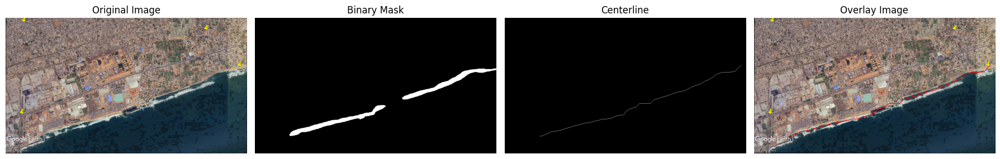

In [48]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from skimage.morphology import skeletonize

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Image not found: {image_path}")

    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, img_size)

    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to tensor
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to extract centerline from binary mask
def extract_centerline(binary_mask, kernel_size=10, dilation_iterations=10):
    """
    Preprocesses the binary mask using morphological closing (to bridge gaps)
    and dilation (to further connect nearby regions) before applying skeletonization.

    Parameters:
        binary_mask (np.ndarray): Input binary mask (expected shape: H x W).
        kernel_size (int): Kernel size for morphological operations.
        dilation_iterations (int): Number of dilation iterations.

    Returns:
        np.ndarray: The skeletonized (centerline) image (0-255 uint8).
    """
    # If the binary mask has more than 2 dimensions, take only one channel.
    if len(binary_mask.shape) > 2:
        binary_mask = binary_mask[:, :, 0]

    # Ensure binary mask is in binary format (0 and 1)
    binary_mask = (binary_mask > 0).astype(np.uint8)

    # Apply morphological closing to fill small gaps.
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_size, kernel_size))
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Optionally, apply a small dilation to further connect components.
    dilated_mask = cv2.dilate(closed_mask, kernel, iterations=dilation_iterations)

    # Now perform skeletonization on the processed mask.
    skeleton = skeletonize(dilated_mask)

    # Convert the resulting boolean skeleton to uint8 (0-255)
    return (skeleton * 255).astype(np.uint8)

# Function to overlay centerline on the original image
def overlay_centerline(original_image, centerline, line_color=(255, 0, 0)):
    # Ensure centerline is 2D
    if centerline.ndim > 2:
        centerline = np.squeeze(centerline)

    if centerline.ndim != 2:
        raise ValueError("Centerline must be a single-channel grayscale image.")

    overlay_image = original_image.copy()
    coords = np.column_stack(np.where(centerline > 0))

    for y, x in coords:
        cv2.circle(overlay_image, (x, y), radius=1, color=line_color, thickness=-1)

    return overlay_image

# Function to visualize results
def visualize_results(original_image, binary_mask, centerline, overlay_image):
    plt.figure(figsize=(18, 6))

    # Original image
    plt.subplot(1, 4, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    # Binary mask
    plt.subplot(1, 4, 2)
    plt.imshow(binary_mask, cmap="gray")
    plt.title("Binary Mask")
    plt.axis("off")

    # Centerline
    plt.subplot(1, 4, 3)
    plt.imshow(centerline, cmap="gray")
    plt.title("Centerline")
    plt.axis("off")

    # Overlay image
    plt.subplot(1, 4, 4)
    plt.imshow(overlay_image)
    plt.title("Overlay Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"
    image_path = "/content/drive/MyDrive/boundary_drive_file/trails/r2023.tif"

    # Model parameters
    img_size = (512, 512)  # Image size for the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    # Ensure build_unet() is defined in a previous cell before executing this.
    model = build_unet()  # Replace with your U-Net model definition
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess the input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0).cpu().numpy()

        # If the prediction has more than one channel, use the first channel.
        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Extract the centerline from the binary mask using morphological operations to improve connectivity.
    centerline = extract_centerline(binary_mask_resized, kernel_size=10, dilation_iterations=10)

    # Overlay the centerline on the original image
    overlay_image = overlay_centerline(original_image, centerline)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, centerline, overlay_image)


<ipython-input-57-417735654cb5>:135: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


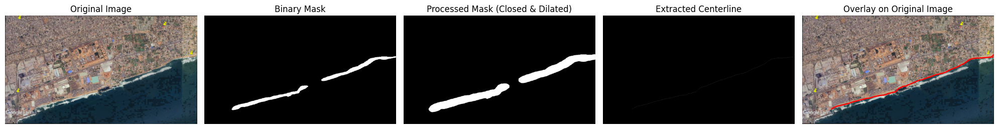

In [57]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from scipy.interpolate import interp1d

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Image not found: {image_path}")

    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, img_size)

    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to tensor
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to process and connect shoreline in binary mask
def process_shoreline(binary_mask, kernel_size=7, dilation_iterations=5):
    """
    Applies morphological operations to connect gaps in the shoreline and ensures continuity.
    """
    if len(binary_mask.shape) > 2:
        binary_mask = binary_mask[:, :, 0]

    binary_mask = (binary_mask > 0).astype(np.uint8) * 255  # Ensure binary format

    # Morphological closing to fill gaps
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Dilation followed by erosion (Closing gaps and smoothing edges)
    dilated_mask = cv2.dilate(closed_mask, kernel, iterations=dilation_iterations)
    smoothed_mask = cv2.erode(dilated_mask, kernel, iterations=1)

    return smoothed_mask

# Function to extract centerline from the processed binary mask
def extract_centerline(binary_mask):
    """
    Extracts the centerline from the binary mask using thinning.
    """
    binary_mask = (binary_mask > 0).astype(np.uint8) * 255  # Ensure binary format
    skeleton = cv2.ximgproc.thinning(binary_mask)  # Thinning instead of skeletonize
    return skeleton

# Function to interpolate and further smooth disconnected segments
def interpolate_centerline(centerline):
    """
    Interpolates disconnected points in the centerline to ensure continuity.
    """
    coords = np.column_stack(np.where(centerline > 0))
    if len(coords) < 2:
        return centerline  # No enough points to interpolate

    x, y = coords[:, 1], coords[:, 0]
    interp_func = interp1d(x, y, kind="linear", fill_value="extrapolate")

    new_x = np.linspace(min(x), max(x), num=200)  # Generate more points
    new_y = interp_func(new_x).astype(int)

    interpolated_centerline = np.zeros_like(centerline)
    for i in range(len(new_x)):
        interpolated_centerline[new_y[i], int(new_x[i])] = 255  # Draw points

    return interpolated_centerline

# Function to overlay centerline on the original image
def overlay_centerline(original_image, centerline, line_color=(255, 0, 0), thickness=5):
    if centerline.ndim > 2:
        centerline = np.squeeze(centerline)

    overlay_image = original_image.copy()
    coords = np.column_stack(np.where(centerline > 0))

    # Draw the centerline as a polyline instead of dots
    if len(coords) > 1:
        for i in range(len(coords) - 1):
            cv2.line(overlay_image, (coords[i][1], coords[i][0]), (coords[i + 1][1], coords[i + 1][0]),
                     color=line_color, thickness=thickness)

    return overlay_image


# Function to visualize results
def visualize_results(original_image, binary_mask, processed_mask, centerline, overlay_image):
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 5, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.imshow(binary_mask, cmap="gray")
    plt.title("Binary Mask")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.imshow(processed_mask, cmap="gray")
    plt.title("Processed Mask (Closed & Dilated)")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.imshow(centerline, cmap="gray")
    plt.title("Extracted Centerline")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.imshow(overlay_image)
    plt.title("Overlay on Original Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"
    image_path = "/content/drive/MyDrive/boundary_drive_file/trails/r2023.tif"

    # Model parameters
    img_size = (512, 512)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    model = build_unet()  # Replace with your U-Net model definition
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0).cpu().numpy()

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Process shoreline to close gaps
    processed_mask = process_shoreline(binary_mask_resized, kernel_size=7, dilation_iterations=5)

    # Extract centerline using thinning
    centerline = extract_centerline(processed_mask)

    # Interpolate centerline to further smoothen gaps
    interpolated_centerline = interpolate_centerline(centerline)

    # Overlay the centerline on the original image
    overlay_image = overlay_centerline(original_image, interpolated_centerline)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, processed_mask, interpolated_centerline, overlay_image)


<ipython-input-61-b85b2cdcd039>:148: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


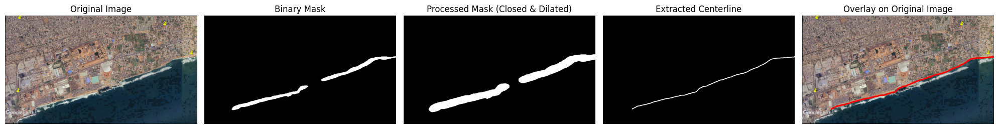

In [61]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from scipy.interpolate import interp1d

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Image not found: {image_path}")

    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, img_size)

    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to tensor
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to process and connect shoreline in binary mask
def process_shoreline(binary_mask, kernel_size=7, dilation_iterations=5):
    """
    Applies morphological operations to connect gaps in the shoreline and ensures continuity.
    """
    if len(binary_mask.shape) > 2:
        binary_mask = binary_mask[:, :, 0]

    binary_mask = (binary_mask > 0).astype(np.uint8) * 255  # Ensure binary format

    # Morphological closing to fill gaps
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Dilation followed by erosion (Closing gaps and smoothing edges)
    dilated_mask = cv2.dilate(closed_mask, kernel, iterations=dilation_iterations)
    smoothed_mask = cv2.erode(dilated_mask, kernel, iterations=1)

    return smoothed_mask

# Function to extract centerline from the processed binary mask
def extract_centerline(binary_mask):
    """
    Extracts the centerline from the binary mask using thinning.
    """
    binary_mask = (binary_mask > 0).astype(np.uint8) * 255  # Ensure binary format
    skeleton = cv2.ximgproc.thinning(binary_mask)  # Thinning instead of skeletonize
    return skeleton

# Function to interpolate and further smooth disconnected segments
def interpolate_centerline(centerline, thickness=3):
    """
    Interpolates disconnected points in the centerline and ensures visibility by drawing thicker lines.
    """
    coords = np.column_stack(np.where(centerline > 0))
    if len(coords) < 2:
        return centerline  # Not enough points to interpolate

    x, y = coords[:, 1], coords[:, 0]

    # Sort x-values to ensure correct interpolation order
    sorted_indices = np.argsort(x)
    x_sorted = x[sorted_indices]
    y_sorted = y[sorted_indices]

    # Linear interpolation
    interp_func = interp1d(x_sorted, y_sorted, kind="linear", fill_value="extrapolate")
    new_x = np.linspace(min(x_sorted), max(x_sorted), num=200)
    new_y = interp_func(new_x).astype(int)

    # Create a blank image for the interpolated centerline
    interpolated_centerline = np.zeros_like(centerline)

    # Draw a continuous thick line instead of isolated points
    for i in range(len(new_x) - 1):
        cv2.line(interpolated_centerline,
                 (int(new_x[i]), new_y[i]),
                 (int(new_x[i + 1]), new_y[i + 1]),
                 255, thickness)

    return interpolated_centerline


# Function to overlay centerline on the original image
def overlay_centerline(original_image, centerline, line_color=(255, 0, 0), thickness=3):
    if centerline.ndim > 2:
        centerline = np.squeeze(centerline)

    overlay_image = original_image.copy()
    coords = np.column_stack(np.where(centerline > 0))

    # Draw the centerline as a polyline instead of dots
    if len(coords) > 1:
        for i in range(len(coords) - 1):
            cv2.line(overlay_image, (coords[i][1], coords[i][0]), (coords[i + 1][1], coords[i + 1][0]),
                     color=line_color, thickness=thickness)

    return overlay_image


# Function to visualize results
def visualize_results(original_image, binary_mask, processed_mask, centerline, overlay_image):
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 5, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.imshow(binary_mask, cmap="gray")
    plt.title("Binary Mask")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.imshow(processed_mask, cmap="gray")
    plt.title("Processed Mask (Closed & Dilated)")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.imshow(centerline, cmap="gray")
    plt.title("Extracted Centerline")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.imshow(overlay_image)
    plt.title("Overlay on Original Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"
    image_path = "/content/drive/MyDrive/boundary_drive_file/trails/r2023.tif"

    # Model parameters
    img_size = (512, 512)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load trained model
    model = build_unet()  # Replace with your U-Net model definition
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Preprocess input image
    image_tensor, original_image = preprocess_image(image_path, img_size)
    image_tensor = image_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        pred_mask = model(image_tensor)
        pred_mask = torch.sigmoid(pred_mask).squeeze(0).cpu().numpy()

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]

    # Threshold the mask to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)

    # Resize the binary mask to match the original image dimensions
    binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Process shoreline to close gaps
    processed_mask = process_shoreline(binary_mask_resized, kernel_size=7, dilation_iterations=5)

    # Extract centerline using thinning
    centerline = extract_centerline(processed_mask)

    # Interpolate centerline to further smoothen gaps
    interpolated_centerline = interpolate_centerline(centerline)

    # Overlay the centerline on the original image
    overlay_image = overlay_centerline(original_image, interpolated_centerline)

    # Visualize results
    visualize_results(original_image, binary_mask_resized, processed_mask, interpolated_centerline, overlay_image)


## Overlay line on two images for changes


<ipython-input-62-012e57ef2af7>:99: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device), strict=False)


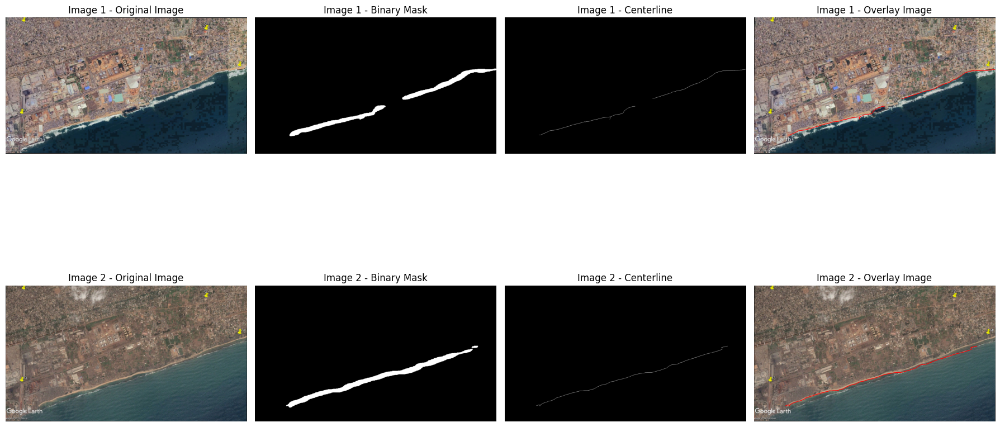

In [62]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from skimage.morphology import skeletonize

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Image not found: {image_path}")

    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, img_size)

    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to tensor
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to extract centerline from binary mask
def extract_centerline(binary_mask):
    if len(binary_mask.shape) > 2:  # Ensure it's a single-channel image
        binary_mask = binary_mask[:, :, 0]  # Take only one channel if mistakenly 3D

    binary_mask = (binary_mask > 0).astype(np.uint8)  # Ensure binary format
    skeleton = skeletonize(binary_mask)
    return (skeleton * 255).astype(np.uint8)

# Function to overlay centerline on the original image
def overlay_centerline(original_image, centerline, line_color=(255, 0, 0)):
    if centerline.ndim > 2:
        centerline = np.squeeze(centerline)

    if centerline.ndim != 2:
        raise ValueError("Centerline must be a single-channel grayscale image.")

    overlay_image = original_image.copy()
    coords = np.column_stack(np.where(centerline > 0))

    for y, x in coords:
        cv2.circle(overlay_image, (x, y), radius=1, color=line_color, thickness=-1)

    return overlay_image

# Function to visualize results for two images
def visualize_results(images_data, titles):
    num_images = len(images_data)
    plt.figure(figsize=(18, 6 * num_images))

    for i, (original_image, binary_mask, centerline, overlay_image) in enumerate(images_data):
        row_offset = i * 4  # To arrange images in separate rows

        plt.subplot(num_images, 4, row_offset + 1)
        plt.imshow(original_image)
        plt.title(f"{titles[i]} - Original Image")
        plt.axis("off")

        plt.subplot(num_images, 4, row_offset + 2)
        plt.imshow(binary_mask, cmap="gray")
        plt.title(f"{titles[i]} - Binary Mask")
        plt.axis("off")

        plt.subplot(num_images, 4, row_offset + 3)
        plt.imshow(centerline, cmap="gray")
        plt.title(f"{titles[i]} - Centerline")
        plt.axis("off")

        plt.subplot(num_images, 4, row_offset + 4)
        plt.imshow(overlay_image)
        plt.title(f"{titles[i]} - Overlay Image")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"
    # image_paths = [
    #     "/content/drive/MyDrive/boundary_drive_file/split_data/test/images/p9_aug_82.png",
    #     "/content/drive/MyDrive/boundary_drive_file/split_data/test/images/p8_aug_78.png"
    # ]

    image_paths = [
        "/content/drive/MyDrive/boundary_drive_file/trails/r2023.tif",
        "/content/drive/MyDrive/boundary_drive_file/trails/r2011.tif"
    ]

    # Load trained model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Ensure build_unet() is defined before executing this
    model = build_unet()  # Ensure this function is defined before running
    model.load_state_dict(torch.load(model_path, map_location=device), strict=False)
    model.to(device)
    model.eval()

    images_data = []
    titles = ["Image 1", "Image 2"]

    # Process both images
    for i, image_path in enumerate(image_paths):
        image_tensor, original_image = preprocess_image(image_path)
        image_tensor = image_tensor.to(device)

        with torch.no_grad():
            pred_mask = model(image_tensor)
            pred_mask = torch.sigmoid(pred_mask).squeeze(0).cpu().numpy()

        # Ensure binary_mask is single-channel
        binary_mask = np.squeeze((pred_mask > 0.5).astype(np.uint8))

        # Resize binary_mask properly
        binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

        # Ensure binary_mask_resized is still single-channel
        if binary_mask_resized.ndim == 3:
            binary_mask_resized = binary_mask_resized[:, :, 0]

        centerline = extract_centerline(binary_mask_resized)

        # Convert centerline to RGB for proper visualization
        centerline_rgb = cv2.cvtColor(centerline, cv2.COLOR_GRAY2RGB)

        overlay_image = overlay_centerline(original_image, centerline)

        # Store results for visualization
        images_data.append((original_image, binary_mask_resized, centerline_rgb, overlay_image))

    # Visualize both images side by side
    visualize_results(images_data, titles)

## Overlay line on two images for changes 2

<ipython-input-66-ffb7459660c2>:152: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


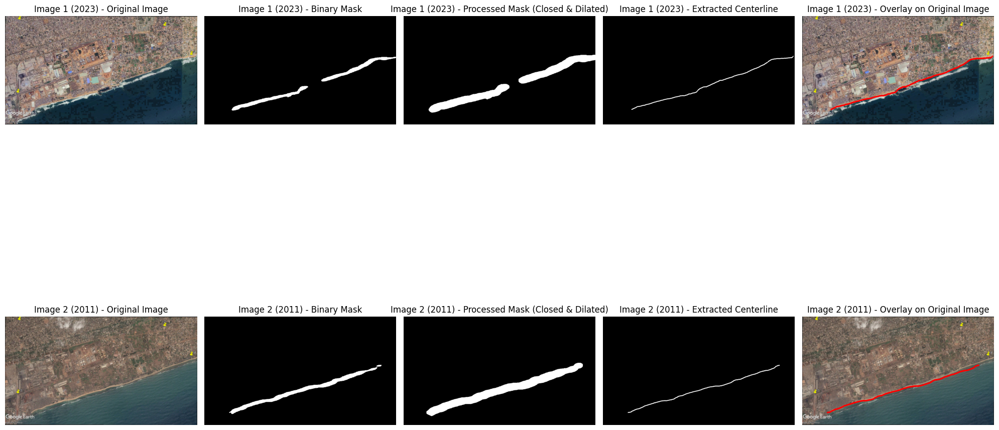

In [66]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from skimage.morphology import skeletonize
from scipy.interpolate import interp1d

# Function to preprocess images
def preprocess_image(image_path, img_size=(512, 512)):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Image not found: {image_path}")

    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, img_size)

    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to tensor
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to process shoreline by filling gaps
def process_shoreline(binary_mask, kernel_size=7, dilation_iterations=5):
    """
    Applies morphological operations to connect gaps in the shoreline and ensures continuity.
    """
    if len(binary_mask.shape) > 2:
        binary_mask = binary_mask[:, :, 0]

    binary_mask = (binary_mask > 0).astype(np.uint8) * 255  # Ensure binary format

    # Morphological closing to fill gaps
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Dilation followed by erosion (Closing gaps and smoothing edges)
    dilated_mask = cv2.dilate(closed_mask, kernel, iterations=dilation_iterations)
    smoothed_mask = cv2.erode(dilated_mask, kernel, iterations=1)

    return smoothed_mask

# Function to extract centerline from processed shoreline
def extract_centerline(binary_mask):
    """
    Extracts the centerline from the binary mask using thinning.
    """
    binary_mask = (binary_mask > 0).astype(np.uint8) * 255  # Ensure binary format
    skeleton = skeletonize(binary_mask)
    return (skeleton * 255).astype(np.uint8)

# Function to interpolate centerline for smoothness
def interpolate_centerline(centerline, thickness=3):
    """
    Interpolates disconnected points in the centerline and ensures visibility by drawing thicker lines.
    """
    coords = np.column_stack(np.where(centerline > 0))
    if len(coords) < 2:
        return centerline  # Not enough points to interpolate

    x, y = coords[:, 1], coords[:, 0]

    # Sort x-values for correct interpolation order
    sorted_indices = np.argsort(x)
    x_sorted = x[sorted_indices]
    y_sorted = y[sorted_indices]

    # Linear interpolation
    interp_func = interp1d(x_sorted, y_sorted, kind="linear", fill_value="extrapolate")
    new_x = np.linspace(min(x_sorted), max(x_sorted), num=200)
    new_y = interp_func(new_x).astype(int)

    # Create blank image for interpolated centerline
    interpolated_centerline = np.zeros_like(centerline)

    # Draw a continuous thick line instead of isolated points
    for i in range(len(new_x) - 1):
        cv2.line(interpolated_centerline,
                 (int(new_x[i]), new_y[i]),
                 (int(new_x[i + 1]), new_y[i + 1]),
                 255, thickness) # Removed extra indent here

    return interpolated_centerline

# Function to overlay centerline on the original image
def overlay_centerline(original_image, centerline, line_color=(255, 0, 0), thickness=3):
    if centerline.ndim > 2:
        centerline = np.squeeze(centerline)

    overlay_image = original_image.copy()
    coords = np.column_stack(np.where(centerline > 0))

    # Draw the centerline as a polyline instead of dots
    if len(coords) > 1:
        for i in range(len(coords) - 1):
            cv2.line(overlay_image, (coords[i][1], coords[i][0]), (coords[i + 1][1], coords[i + 1][0]),
                     color=line_color, thickness=thickness)

    return overlay_image

# Function to visualize results for two images
def visualize_results(images_data, titles):
    num_images = len(images_data)
    plt.figure(figsize=(20, 8 * num_images))

    for i, (original_image, binary_mask, processed_mask, centerline, overlay_image) in enumerate(images_data):
        row_offset = i * 5  # Arrange images in separate rows

        plt.subplot(num_images, 5, row_offset + 1)
        plt.imshow(original_image)
        plt.title(f"{titles[i]} - Original Image")
        plt.axis("off")

        plt.subplot(num_images, 5, row_offset + 2)
        plt.imshow(binary_mask, cmap="gray")
        plt.title(f"{titles[i]} - Binary Mask")
        plt.axis("off")

        plt.subplot(num_images, 5, row_offset + 3)
        plt.imshow(processed_mask, cmap="gray")
        plt.title(f"{titles[i]} - Processed Mask (Closed & Dilated)")
        plt.axis("off")

        plt.subplot(num_images, 5, row_offset + 4)
        plt.imshow(centerline, cmap="gray")
        plt.title(f"{titles[i]} - Extracted Centerline")
        plt.axis("off")

        plt.subplot(num_images, 5, row_offset + 5)
        plt.imshow(overlay_image)
        plt.title(f"{titles[i]} - Overlay on Original Image")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"
    image_paths = [
        "/content/drive/MyDrive/boundary_drive_file/trails/r2023.tif",
        "/content/drive/MyDrive/boundary_drive_file/trails/r2011.tif"
    ]

    # Load trained model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = build_unet()  # Ensure build_unet() is defined before running
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    images_data = []
    titles = ["Image 1 (2023)", "Image 2 (2011)"]

    # Process both images
    for i, image_path in enumerate(image_paths):
        image_tensor, original_image = preprocess_image(image_path)
        image_tensor = image_tensor.to(device)

        with torch.no_grad():
            pred_mask = model(image_tensor)
            pred_mask = torch.sigmoid(pred_mask).squeeze(0).cpu().numpy()

        binary_mask = np.squeeze((pred_mask > 0.5).astype(np.uint8))

        # Resize binary_mask to match original image
        binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

        # Process shoreline for continuity
        processed_mask = process_shoreline(binary_mask_resized, kernel_size=7, dilation_iterations=5)

        # Extract centerline
        centerline = extract_centerline(processed_mask)

        # Interpolate centerline to smooth out gaps
        interpolated_centerline = interpolate_centerline(centerline)

        # Overlay the centerline on the original image
        overlay_image = overlay_centerline(original_image, interpolated_centerline)

        # Store results
        images_data.append((original_image, binary_mask_resized, processed_mask, interpolated_centerline, overlay_image))

    # Visualize results
    visualize_results(images_data, titles)


## Plotting dual polyline 1

<ipython-input-15-8c307d8c12da>:64: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device), strict=False)


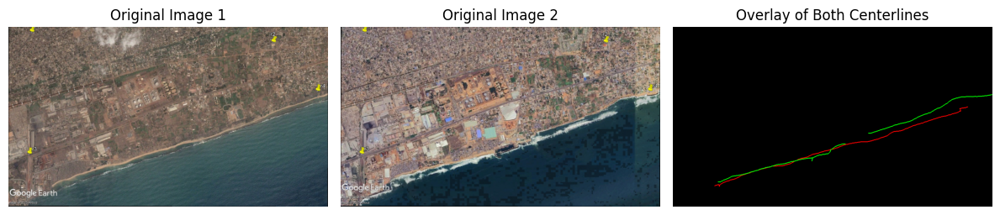

In [15]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from skimage.morphology import skeletonize

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Image not found: {image_path}")

    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, img_size)

    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to tensor
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to extract centerline from binary mask
def extract_centerline(binary_mask):
    if len(binary_mask.shape) > 2:  # Ensure it's a single-channel image
        binary_mask = binary_mask[:, :, 0]  # Take only one channel if mistakenly 3D

    binary_mask = (binary_mask > 0).astype(np.uint8)  # Ensure binary format
    skeleton = skeletonize(binary_mask)
    return (skeleton * 255).astype(np.uint8)

# Function to overlay two centerlines together on a single image
def overlay_both_centerlines(image_shape, centerline1, centerline2, color1=(255, 0, 0), color2=(0, 255, 0)):
    # Create a blank image for overlay
    overlay_image = np.zeros((image_shape[0], image_shape[1], 3), dtype=np.uint8)

    # Add first centerline (Red)
    coords1 = np.column_stack(np.where(centerline1 > 0))
    for y, x in coords1:
        cv2.circle(overlay_image, (x, y), radius=1, color=color1, thickness=-1)

    # Add second centerline (Green)
    coords2 = np.column_stack(np.where(centerline2 > 0))
    for y, x in coords2:
        cv2.circle(overlay_image, (x, y), radius=1, color=color2, thickness=-1)

    return overlay_image

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"
    image_paths = [
        "/content/drive/MyDrive/boundary_drive_file/trails/r2011.tif",
        "/content/drive/MyDrive/boundary_drive_file/trails/r2023.tif"
    ]

    # Load trained model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Ensure build_unet() is defined before executing this
    model = build_unet()  # Ensure this function is defined before running
    model.load_state_dict(torch.load(model_path, map_location=device), strict=False)
    model.to(device)
    model.eval()

    centerlines = []
    original_images = []

    # Process both images
    for image_path in image_paths:
        image_tensor, original_image = preprocess_image(image_path)
        image_tensor = image_tensor.to(device)

        with torch.no_grad():
            pred_mask = model(image_tensor)
            pred_mask = torch.sigmoid(pred_mask).squeeze(0).cpu().numpy()

        # Ensure binary_mask is single-channel
        binary_mask = np.squeeze((pred_mask > 0.5).astype(np.uint8))

        # Resize binary_mask properly
        binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

        centerline = extract_centerline(binary_mask_resized)
        centerlines.append(centerline)
        original_images.append(original_image)

    # Ensure both centerlines are available
    if len(centerlines) == 2:
        combined_centerline = overlay_both_centerlines(original_images[0].shape, centerlines[0], centerlines[1])

        # Visualize results
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 3, 1)
        plt.imshow(original_images[0])
        plt.title("Original Image 1")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(original_images[1])
        plt.title("Original Image 2")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(combined_centerline)
        plt.title("Overlay of Both Centerlines")
        plt.axis("off")

        plt.tight_layout()
        plt.show()


## Plotting dual polyline 2

<ipython-input-71-d7770324ed40>:120: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device), strict=False)


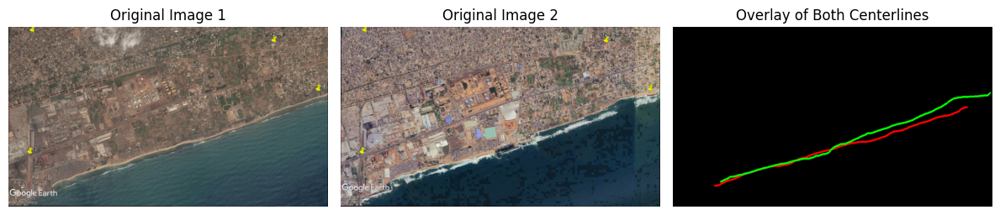

In [71]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from scipy.interpolate import interp1d
from skimage.morphology import skeletonize

# Function to preprocess the image
def preprocess_image(image_path, img_size=(512, 512)):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Image not found: {image_path}")

    original_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, img_size)

    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert to tensor
    ])
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    return image_tensor, original_image

# Function to process and connect shoreline in binary mask
def process_shoreline(binary_mask, kernel_size=7, dilation_iterations=5):
    """
    Applies morphological operations to connect gaps in the shoreline and ensures continuity.
    """
    if len(binary_mask.shape) > 2:
        binary_mask = binary_mask[:, :, 0]

    binary_mask = (binary_mask > 0).astype(np.uint8) * 255  # Ensure binary format

    # Morphological closing to fill gaps
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Dilation followed by erosion (Closing gaps and smoothing edges)
    dilated_mask = cv2.dilate(closed_mask, kernel, iterations=dilation_iterations)
    smoothed_mask = cv2.erode(dilated_mask, kernel, iterations=1)

    return smoothed_mask

# Function to extract centerline from processed shoreline
def extract_centerline(binary_mask):
    """
    Extracts a continuous centerline using thinning and interpolation.
    """
    binary_mask = (binary_mask > 0).astype(np.uint8)  # Ensure binary format
    skeleton = skeletonize(binary_mask)  # Thinning instead of OpenCV thinning
    return (skeleton * 255).astype(np.uint8)

# Function to interpolate and smooth disconnected segments
def interpolate_centerline(centerline, thickness=3):
    """
    Interpolates disconnected points in the centerline and ensures visibility by drawing thicker lines.
    """
    coords = np.column_stack(np.where(centerline > 0))
    if len(coords) < 2:
        return centerline  # Not enough points to interpolate

    x, y = coords[:, 1], coords[:, 0]

    # Sort x-values to ensure correct interpolation order
    sorted_indices = np.argsort(x)
    x_sorted = x[sorted_indices]
    y_sorted = y[sorted_indices]

    # Linear interpolation
    interp_func = interp1d(x_sorted, y_sorted, kind="linear", fill_value="extrapolate")
    new_x = np.linspace(min(x_sorted), max(x_sorted), num=200)
    new_y = interp_func(new_x).astype(int)

    # Create a blank image for the interpolated centerline
    interpolated_centerline = np.zeros_like(centerline)

    # Draw a continuous thick line instead of isolated points
    for i in range(len(new_x) - 1):
        cv2.line(interpolated_centerline,
                 (int(new_x[i]), new_y[i]),
                 (int(new_x[i + 1]), new_y[i + 1]),
                 255, thickness)

    return interpolated_centerline

# Function to overlay two centerlines together on a single image
def overlay_both_centerlines(image_shape, centerline1, centerline2, color1=(255, 0, 0), color2=(0, 255, 0)):
    """
    Overlays two extracted centerlines with different colors.
    """
    overlay_image = np.zeros((image_shape[0], image_shape[1], 3), dtype=np.uint8)

    # Add first centerline (Red)
    coords1 = np.column_stack(np.where(centerline1 > 0))
    for y, x in coords1:
        cv2.circle(overlay_image, (x, y), radius=1, color=color1, thickness=-1)

    # Add second centerline (Green)
    coords2 = np.column_stack(np.where(centerline2 > 0))
    for y, x in coords2:
        cv2.circle(overlay_image, (x, y), radius=1, color=color2, thickness=-1)

    return overlay_image

# Main workflow
if __name__ == "__main__":
    # Paths
    model_path = "/content/drive/MyDrive/boundary_drive_file/final_model.pth"
    image_paths = [
        "/content/drive/MyDrive/boundary_drive_file/trails/r2011.tif",
        "/content/drive/MyDrive/boundary_drive_file/trails/r2023.tif"
    ]

    # Load trained model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Ensure build_unet() is defined before executing this
    model = build_unet()  # Ensure this function is defined before running
    model.load_state_dict(torch.load(model_path, map_location=device), strict=False)
    model.to(device)
    model.eval()

    centerlines = []
    original_images = []

    # Process both images
    for image_path in image_paths:
        image_tensor, original_image = preprocess_image(image_path)
        image_tensor = image_tensor.to(device)

        with torch.no_grad():
            pred_mask = model(image_tensor)
            pred_mask = torch.sigmoid(pred_mask).squeeze(0).cpu().numpy()

        # Ensure binary_mask is single-channel
        binary_mask = np.squeeze((pred_mask > 0.5).astype(np.uint8))

        # Resize binary_mask properly
        binary_mask_resized = cv2.resize(binary_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

        # Process shoreline to close gaps
        processed_mask = process_shoreline(binary_mask_resized, kernel_size=7, dilation_iterations=5)

        # Extract centerline using thinning
        centerline = extract_centerline(processed_mask)

        # Interpolate centerline to further smoothen gaps
        interpolated_centerline = interpolate_centerline(centerline)

        centerlines.append(interpolated_centerline)
        original_images.append(original_image)

    # Ensure both centerlines are available
    if len(centerlines) == 2:
        combined_centerline = overlay_both_centerlines(original_images[0].shape, centerlines[0], centerlines[1])

        # Visualize results
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 3, 1)
        plt.imshow(original_images[0])
        plt.title("Original Image 1")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(original_images[1])
        plt.title("Original Image 2")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(combined_centerline)
        plt.title("Overlay of Both Centerlines")
        plt.axis("off")

        plt.tight_layout()
        plt.show()


In [14]:
# !pip install rasterio
import rasterio

# Replace with your raster file path
raster_path = "/content/drive/MyDrive/boundary_drive_file/trails/r2011.tif"

with rasterio.open(raster_path) as src:
    crs = src.crs
    print("The CRS of the raster file is:", crs)


The CRS of the raster file is: EPSG:32631
